### $$\textbf{SUPPORT VECTOR MACHINE MODEL}$$ $$\textbf{FOR GALACTIC PARAMETERS PREDICTIONS}$$

In [2]:
import pandas as pd
import pandas.plotting as pdplt
import numpy as np
import astropy as ast
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import sklearn

matplotlib.rcdefaults()

In [3]:
df_mass = pd.read_csv("catalogs/EGS_stellar_mass_noon.csv")
df_mass = df_mass[df_mass > -90]

df_phys = pd.read_csv("catalogs/EGS_physical_properties_noon.csv")
df_phys = df_phys[df_phys > -90]

df_reds = pd.read_csv("catalogs/EGS_redshift_noon.csv")

df_mult = pd.read_csv("catalogs/EGS_multiband_noon.csv")

In [4]:
df_test = pd.read_csv('testing_dataframe.csv')
df_test_80 = pd.read_csv('testing_dataframe_80.csv')

df_props = pd.read_csv('props_80.csv')
df_mass = pd.read_csv('mass_80.csv')
df_sfr = pd.read_csv('sfr_80.csv')
X_train = np.array([fila for _, fila in df_props.iterrows()])
y_train_mass = np.ravel(np.array([fila for _, fila in df_mass.iterrows()]))
y_train_sfr = np.ravel(np.array([fila for _, fila in df_sfr.iterrows()]))


df_props_test = pd.read_csv('props_20.csv')
df_mass_test = pd.read_csv('mass_20.csv')
df_sfr_test = pd.read_csv('sfr_20.csv')
X_test = np.array([fila for _, fila in df_props_test.iterrows()])
y_test_mass = np.ravel(np.array([fila for _, fila in df_mass_test.iterrows()]))
y_test_sfr = np.ravel(np.array([fila for _, fila in df_sfr_test.iterrows()]))


display(X_train)
print()
display(y_train_mass)
print()
display(y_train_sfr)

array([[  1.782     , -16.49      , -16.48      , ..., -15.96      ,
          0.0462544 ,   2.83321334],
       [  1.65      , -18.83      , -19.31      , ..., -19.57      ,
          0.0907874 ,   5.0369526 ],
       [  2.267     , -19.29      , -19.71      , ..., -19.        ,
          0.0581966 ,   4.79579055],
       ...,
       [  1.532     , -16.39      , -16.88      , ..., -17.26      ,
          0.184629  ,   3.29583687],
       [  1.504     , -18.76      , -18.86      , ..., -18.78      ,
          0.166963  ,   5.21493576],
       [  1.822     , -18.25      , -18.87      , ..., -19.01      ,
          0.0775075 ,   4.15888308]])

array([7.0721, 8.943 , 8.9499, ..., 8.2301, 8.6506, 8.871 ])

array([-0.68803222,  0.27724237,  0.4109644 , ..., -0.42725847,
        0.36485105, -0.02720724])

Linear Learning Machines

In [5]:
from sklearn import svm

mass_model = svm.SVR(kernel='linear')
mass_model.fit(X_train, y_train_mass)

SVR(kernel='linear')

In [7]:
from sklearn import svm
C = 1
gamma = 1
sfr_model = svm.SVR(kernel = 'rbf')
sfr_model.fit(X_train, y_train_sfr)

SVR()

In [8]:
# save the model to disk
import pickle
filename1 = 'mass_model_beta.sav'
filename2 = 'sfr_model_beta.sav'
pickle.dump(mass_model, open(filename1, 'wb'))
pickle.dump(sfr_model, open(filename2, 'wb'))

# load the model from disk
import pickle
regr = pickle.load(open('mass_model_beta.sav', 'rb'))
result = regr.score(X2, y2)
print(result)

In [6]:
print('mass_coefs =', mass_model.coef_)
print()
#print('sfr_coefs =', sfr_model.coef_)

mass_coefs = [[-0.03568277  0.5119707  -0.41270458 -0.08264754  0.12906482 -0.44753912
  -0.13356125  0.03486703  0.19394455  0.01875887]]



In [9]:
mass_model.score(X_test, y_test_mass)

0.9774186520498959

In [10]:
sfr_model.score(X_test, y_test_sfr)

0.9226713026010847

---

In [90]:
df_test.sample(n=5)

,redshift,mass,M_U,M_B,M_V,M_R,M_I,M_J,M_K,EBV,isoarea,SFR
12501,2.047,8.9506,-17.51,-18.31,-18.76,-18.96,-19.15,-19.50,-19.35,0.329744,3.258097,0.407194
809,1.855,10.2198,-19.39,-20.35,-20.97,-21.34,-21.67,-22.44,-22.68,0.583529,5.918894,1.697397
13219,1.769,8.3608,-18.17,-18.63,-18.67,-18.65,-18.52,-18.26,-17.77,0.091825,2.995732,0.038207
11379,1.572,7.9313,-16.59,-17.19,-17.24,-17.24,-17.16,-16.87,-16.33,0.145849,3.044522,-0.449582
4476,2.218,9.4671,-19.58,-20.26,-20.54,-20.64,-20.73,-20.98,-20.82,0.258755,5.141664,1.069457


In [91]:
print('Predicted mass    =', mass_model.predict([[2.444,	-21.87,	-22.33,	-22.47,	-22.43,	-22.36,	-22.35,	-21.99,	0.101840,	6.501290]])[0])
print('Experimental mass =', df_test['mass'][7530])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.266,	-18.51,	-19.09,	-19.40,	-19.56,	-19.74,	-20.35,	-20.42,	0.224139,	4.174387]])[0])
print('Experimental mass =', df_test['mass'][6630])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.141,	-19.04,	-19.21,	-19.29,	-19.26,	-19.12,	-19.26,	-19.00,	0.108428,	4.465908]])[0])
print('Experimental mass =', df_test['mass'][3228])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.100,	-19.59,	-20.06,	-20.18,	-20.20,	-20.18,	-20.33,	-20.09,	0.108471,	5.220356]])[0])
print('Experimental mass =', df_test['mass'][6685])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.922,	-20.42,	-21.13,	-21.35,	-21.44,	-21.50,	-21.72,	-21.55,	0.134350,	6.011267]])[0])
print('Experimental mass =', df_test['mass'][2691])

print()
print('####################################################################')
print()

print('Predicted sfr    =', sfr_model.predict([[2.444,	-21.87,	-22.33,	-22.47,	-22.43,	-22.36,	-22.35,	-21.99,	0.101840,	6.501290]])[0])
print('Experimental sfr =', df_test['SFR'][7530])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.266,	-18.51,	-19.09,	-19.40,	-19.56,	-19.74,	-20.35,	-20.42,	0.224139,	4.174387]])[0])
print('Experimental sfr =', df_test['SFR'][6630])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.141,	-19.04,	-19.21,	-19.29,	-19.26,	-19.12,	-19.26,	-19.00,	0.108428,	4.465908]])[0])
print('Experimental sfr =', df_test['SFR'][3228])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.100,	-19.59,	-20.06,	-20.18,	-20.20,	-20.18,	-20.33,	-20.09,	0.108471,	5.220356]])[0])
print('Experimental sfr =', df_test['SFR'][6685])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.922,	-20.42,	-21.13,	-21.35,	-21.44,	-21.50,	-21.72,	-21.55,	0.134350,	6.011267]])[0])
print('Experimental sfr =', df_test['SFR'][2691])

Predicted mass    = 9.980765659641008
Experimental mass = 9.9162
---------------------------------------------------------
Predicted mass    = 9.081999404249643
Experimental mass = 9.1901
---------------------------------------------------------
Predicted mass    = 8.503750300809486
Experimental mass = 8.559
---------------------------------------------------------
Predicted mass    = 9.120121550460851
Experimental mass = 9.1189
---------------------------------------------------------
Predicted mass    = 9.825140141035433
Experimental mass = 9.8224

####################################################################

Predicted sfr    = 1.5111140453321261
Experimental sfr = 1.48809503233318
---------------------------------------------------------
Predicted sfr    = 0.5834631663404171
Experimental sfr = 0.5308819907561781
---------------------------------------------------------
Predicted sfr    = 0.3892351669420353
Experimental sfr = 0.3946862765684557
-------------------------------

---

In [92]:
predicted_mass = mass_model.predict(np.array(df_props_test))
predicted_sfr = sfr_model.predict(np.array(df_props_test))

In [93]:
from sklearn.metrics import mean_squared_error

print('mean squared error for mass:', mean_squared_error(y_test_mass, predicted_mass))
print()
print('mean squared error for SFR:', mean_squared_error(y_test_sfr, predicted_sfr))

mean squared error for mass: 0.012093522658710451

mean squared error for SFR: 0.02673610528356683


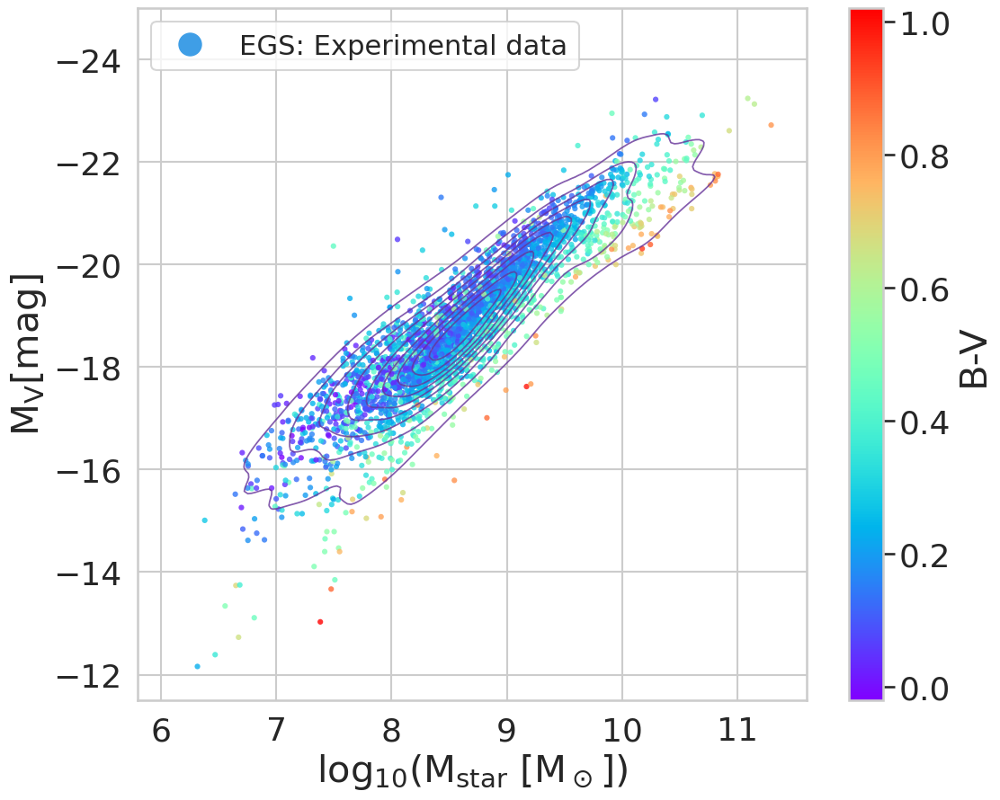

In [94]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = y_test_mass
x22 = predicted_mass

y11 = df_props_test['M_V']
y22 = df_props_test['M_V']

z = pd.DataFrame(df_props_test['M_B'] - df_props_test['M_V'])
z.columns = ['B-V']


fig = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = fig.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-25, -11.5])
plt.xlim([5.8, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('EGS_mv_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

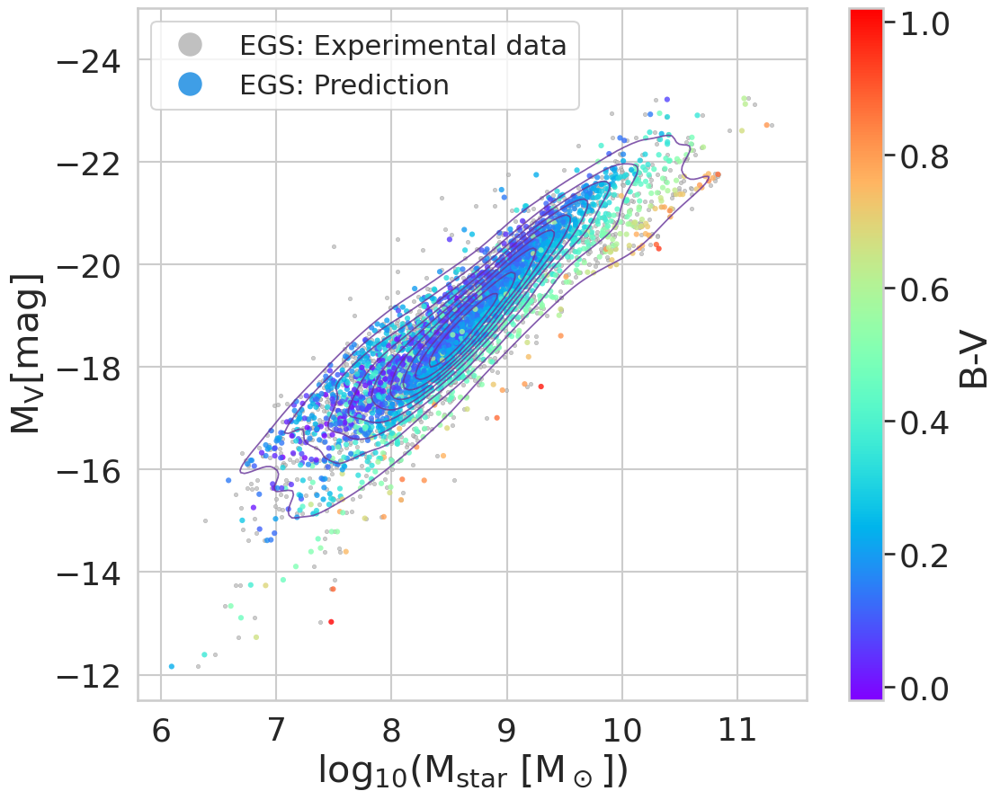

In [95]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = y_test_mass
x22 = predicted_mass

y11 = df_props_test['M_V']
y22 = df_props_test['M_V']

z = pd.DataFrame(df_props_test['M_B'] - df_props_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-25, -11.5])
plt.xlim([5.8, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('EGS_mv_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

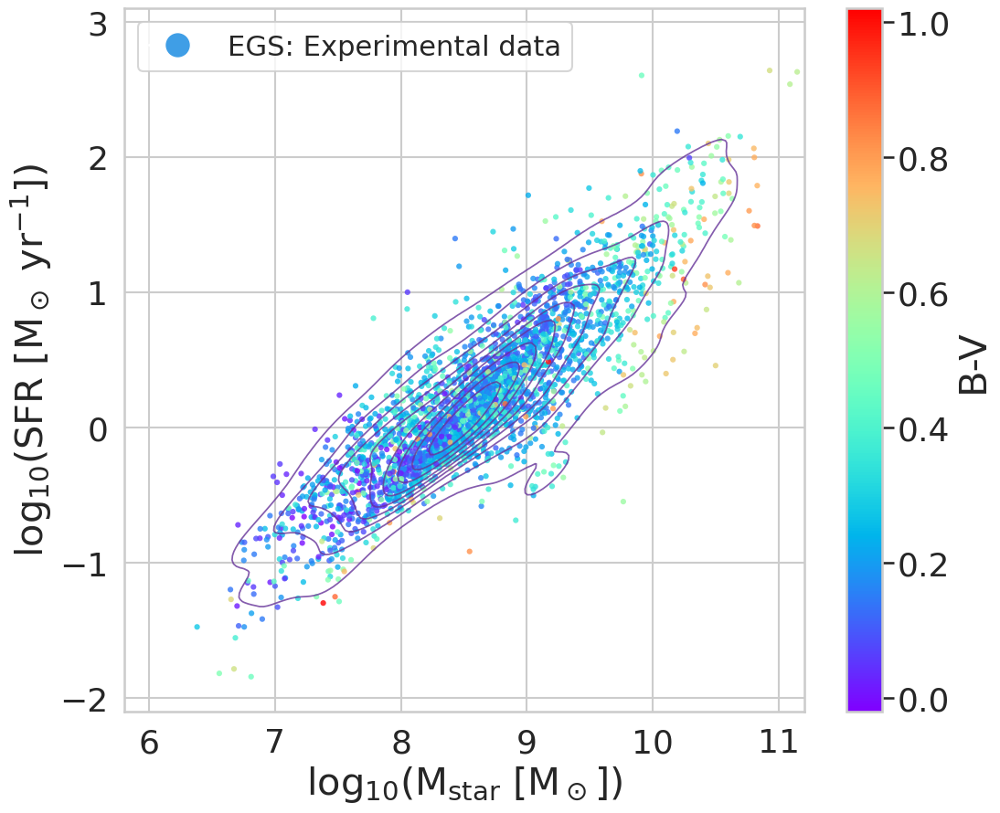

In [96]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

sfr = pd.read_csv('sfr_80.csv')

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26)
matplotlib.rc('ytick', labelsize=26) 

x11 = df_mass_test['mass']
x22 = predicted_mass

y11 = df_sfr_test['SFR']
y22 = predicted_sfr

z = pd.DataFrame(df_props_test['M_B'] - df_props_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-2.1, 3.1])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_sfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

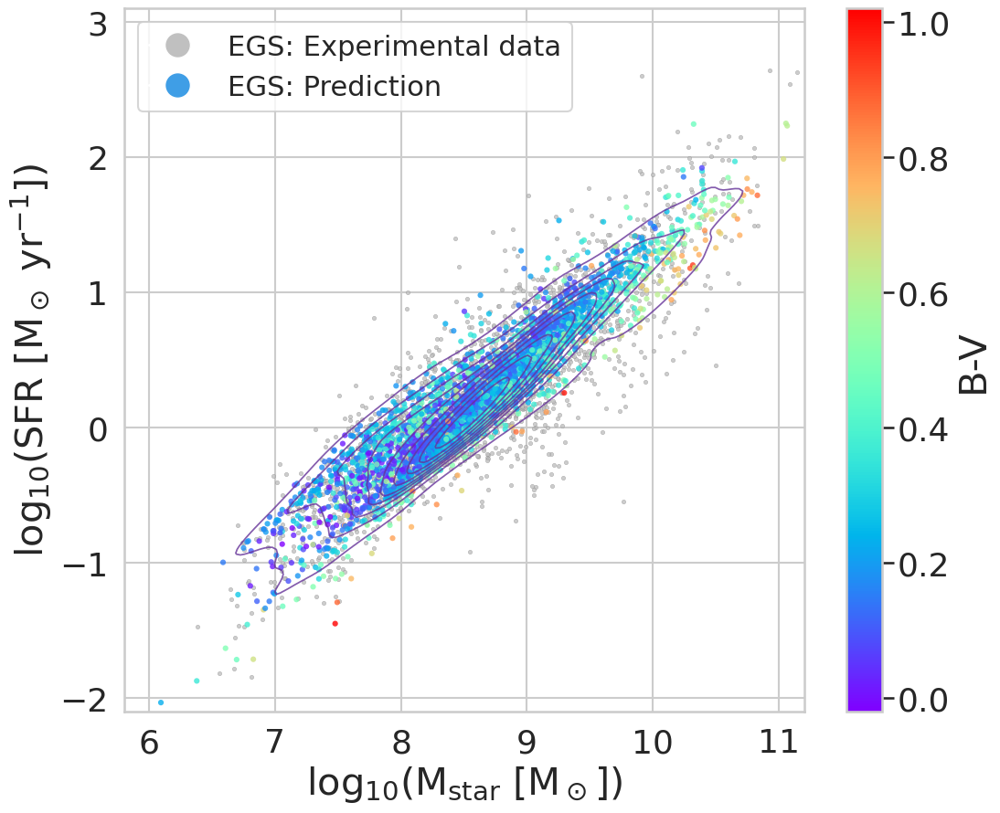

In [97]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

sfr = pd.read_csv('sfr_80.csv')

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26)
matplotlib.rc('ytick', labelsize=26) 

x11 = df_mass_test['mass']
x22 = predicted_mass

y11 = df_sfr_test['SFR']
y22 = predicted_sfr

z = pd.DataFrame(df_props_test['M_B'] - df_props_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-2.1, 3.1])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_sfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()


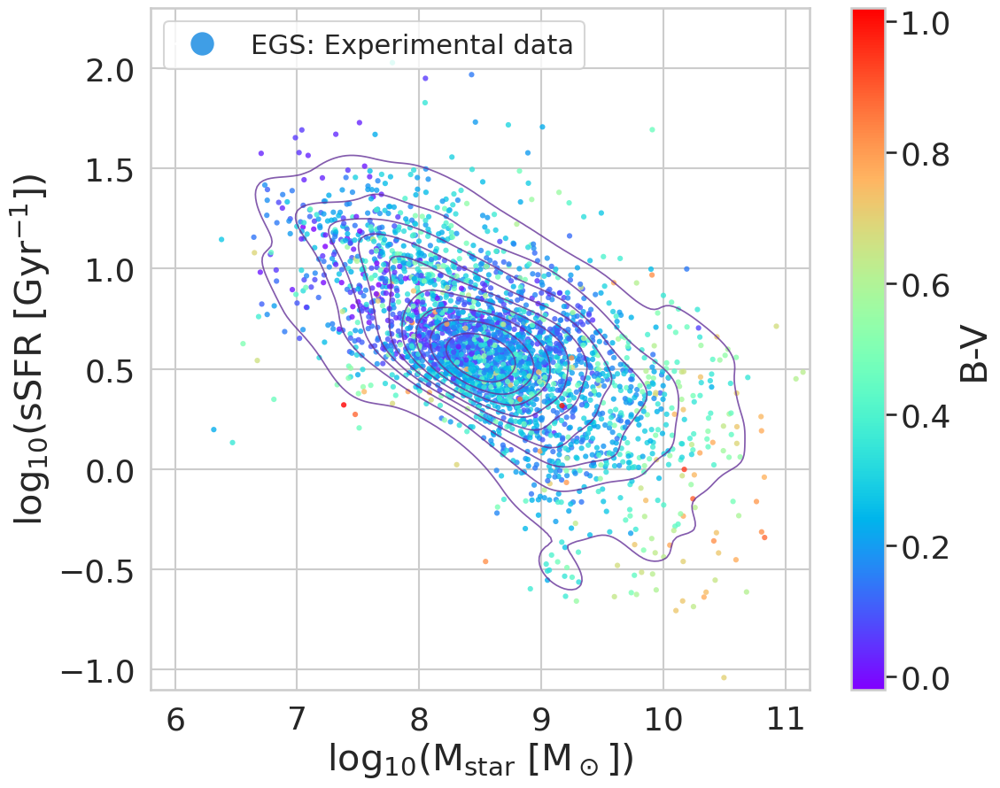

In [98]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_mass_test['mass']
x22 = predicted_mass


y11 = (-df_mass_test['mass']+df_sfr_test['SFR'])+9
y22 = (-predicted_mass+predicted_sfr)+9

z = pd.DataFrame(df_props_test['M_B'] - df_props_test['M_V'])
z.columns = ['B-V']




ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)


legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

ax.figure.savefig('EGS_ssfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

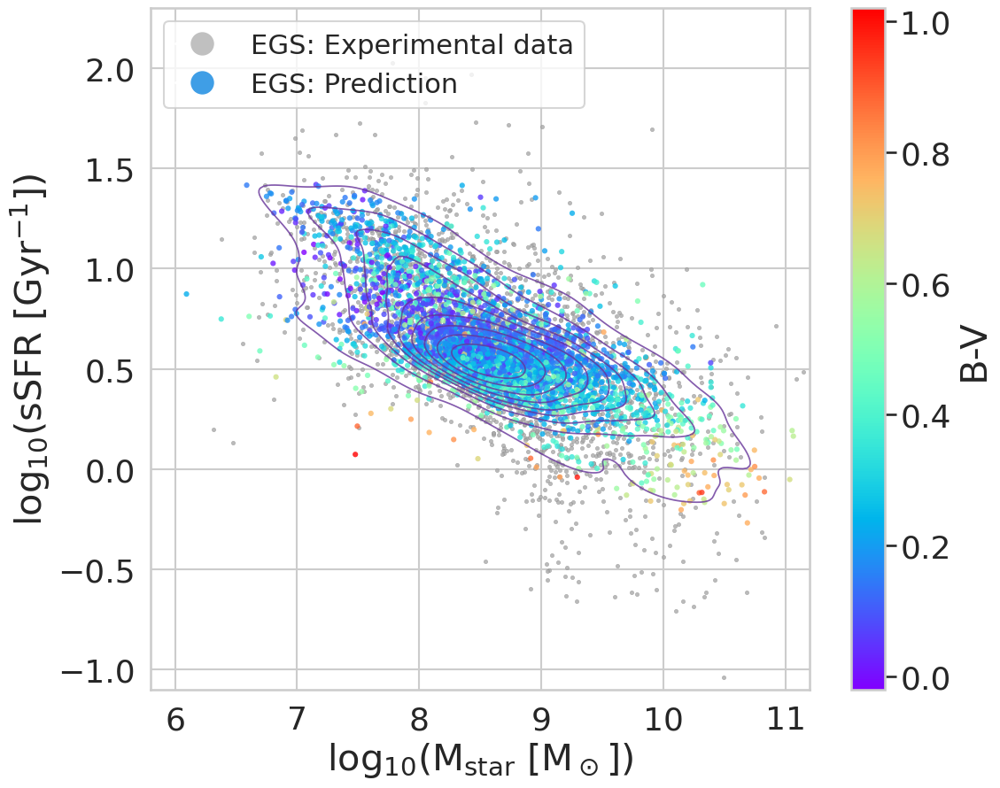

In [99]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_mass_test['mass']
x22 = predicted_mass


y11 = (-df_mass_test['mass']+df_sfr_test['SFR'])+9
y22 = (-predicted_mass+predicted_sfr)+9

z = pd.DataFrame(df_props_test['M_B'] - df_props_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'darkgray', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

fig = ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_ssfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

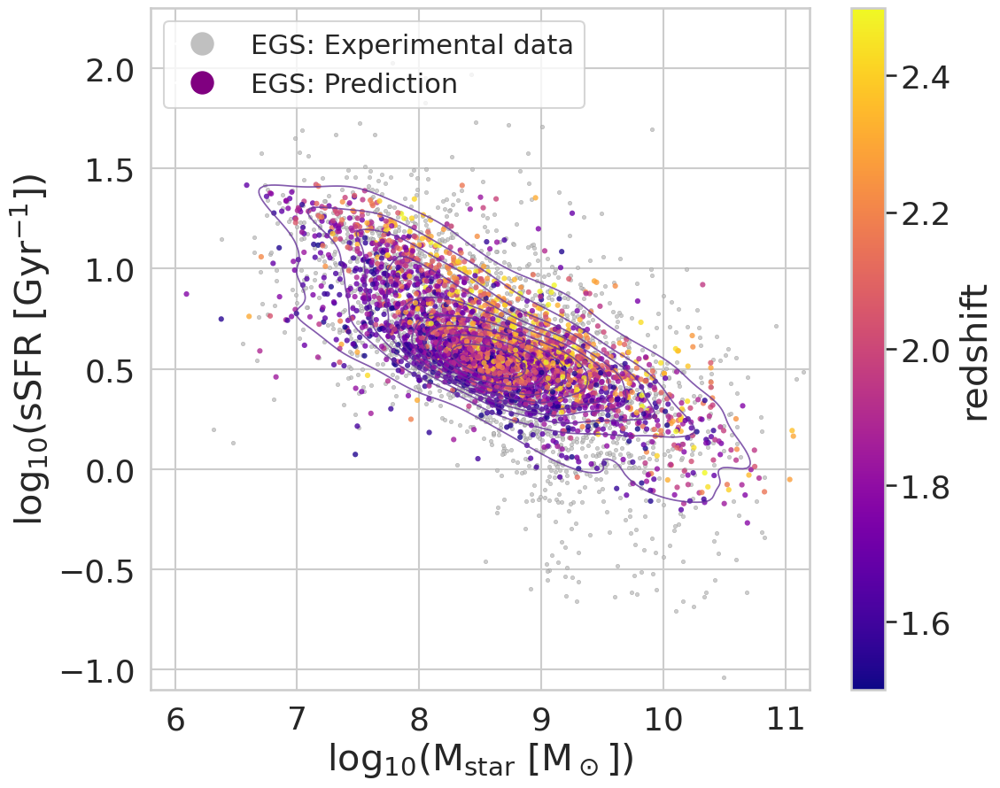

In [100]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_mass_test['mass']
x22 = predicted_mass


y11 = (-df_mass_test['mass']+df_sfr_test['SFR'])+9
y22 = (-predicted_mass+predicted_sfr)+9

z = pd.DataFrame(df_props_test['redshift'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'plasma')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='purple', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='redshift', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_ssfr_pred_redshift.png',dpi=300, bbox_inches = 'tight')

plt.show()

---
## $$\textbf{COSMOS}$$

In [101]:
df_mass_cosmos = pd.read_csv("catalogs/COSMOS_stellar_mass.csv")
df_mass_cosmos = df_mass_cosmos[df_mass_cosmos > -90]

df_phys_cosmos = pd.read_csv("catalogs/COSMOS_phys_props.csv")
df_phys_cosmos = df_phys_cosmos[df_phys_cosmos > -90]

df_reds_cosmos = pd.read_csv("catalogs/COSMOS_redshift.csv")

df_mult_cosmos = pd.read_csv("catalogs/COSMOS_multiband.csv")

In [102]:
redshift = df_reds_cosmos[["z_best"]]
redshift.columns = ['redshift']

masa = df_mass_cosmos[['M_neb_med']]
masa.columns = ['mass']

serr = df_mass_cosmos['s_neb_med'].mean()
merr = df_mass_cosmos['M_neb_med'].mean()
print('serr =', np.log10(serr))

Mag_abs_U = df_phys_cosmos[['UMag_6a_tau_NEB']]
Mag_abs_U.columns = ['M_U']

Mag_abs_B = df_phys_cosmos[['BMag_6a_tau_NEB']]
Mag_abs_B.columns = ['M_B']

Mag_abs_V = df_phys_cosmos[['VMag_6a_tau_NEB']]
Mag_abs_V.columns = ['M_V']

Mag_abs_R = df_phys_cosmos[['RMag_6a_tau_NEB']]
Mag_abs_R.columns = ['M_R']

Mag_abs_I = df_phys_cosmos[['IMag_6a_tau_NEB']]
Mag_abs_I.columns = ['M_I']

Mag_abs_J = df_phys_cosmos[['JMag_6a_tau_NEB']]
Mag_abs_J.columns = ['M_J']

Mag_abs_K = df_phys_cosmos[['KMag_6a_tau_NEB']]
Mag_abs_K.columns = ['M_K']

EBV = df_phys_cosmos[['EBV_6a_tau_NEB']]
EBV.columns = ['EBV']

SFR = np.log10(df_phys_cosmos[['SFR_14a']])
SFR.columns = ['SFR']

isoarea = np.log(df_mult_cosmos[['ISOAREAF_IMAGE']])
isoarea.columns = ['isoarea']

df_test = pd.concat([redshift, masa, Mag_abs_U, Mag_abs_B, Mag_abs_V, Mag_abs_R, Mag_abs_I, Mag_abs_J, Mag_abs_K, EBV, SFR, isoarea], axis = 1)
df_test = df_test.dropna()

print(df_test.shape)

serr = -0.6688113828553962
(3152, 12)


In [103]:
df_test.sample(n=5)

,redshift,mass,M_U,M_B,M_V,M_R,M_I,M_J,M_K,EBV,SFR,isoarea
1787,1.535,10.10,-18.14,-19.18,-19.87,-20.28,-20.67,-21.51,-21.81,0.55,1.669038,5.811141
1928,1.759,7.86,-17.65,-17.58,-17.69,-17.58,-17.09,-17.08,-16.76,0.06,0.166134,4.143135
1341,2.355,9.13,-19.99,-20.22,-20.30,-20.27,-20.16,-20.30,-20.03,0.06,1.366423,5.293305
1533,2.385,9.53,-21.07,-21.26,-21.41,-21.26,-20.96,-20.90,-20.45,0.06,1.486005,5.521461
3257,1.508,9.27,-19.14,-19.88,-20.05,-20.14,-20.15,-19.94,-19.43,0.03,0.619615,5.030438


In [104]:
print('Predicted mass    =', mass_model.predict([[2.123, -18.99, -19.10, -19.28, -19.30, -19.13, -19.41, -19.29, 0.15, 4.158883]])[0])
print('Experimental mass =', df_test['mass'][0])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.239, -19.90, -20.43, -20.76, -20.93, -21.03, -21.50, -21.49, 0.30, 5.153292]])[0])
print('Experimental mass =', df_test['mass'][561])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.522, -18.85, -19.15, -19.33, -19.38, -19.33, -19.61, -19.46, 0.15, 5.023881]])[0])
print('Experimental mass =', df_test['mass'][1737])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.981, -16.93, -16.93, -17.13, -14.09, -16.59, -16.64, -16.37, 0.15, 3.332205]])[0])
print('Experimental mass =', df_test['mass'][2262])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.021, -20.58, -21.09, -21.32, -21.40, -21.44, -21.68, -21.51, 0.10, 6.139885]])[0])
print('Experimental mass =', df_test['mass'][32])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.491, -18.99, -19.26, -19.28, -19.19, -18.89, -18.60, -18.04, 0.06, 4.060443]])[0])
print('Experimental mass =', df_test['mass'][1622])


Predicted mass    = 8.495305914410608
Experimental mass = 8.52
---------------------------------------------------------
Predicted mass    = 9.5866187052099
Experimental mass = 9.78
---------------------------------------------------------
Predicted mass    = 8.729388642450147
Experimental mass = 8.89
---------------------------------------------------------
Predicted mass    = 7.7337892483434985
Experimental mass = 7.85
---------------------------------------------------------
Predicted mass    = 9.690817835438509
Experimental mass = 9.76
---------------------------------------------------------
Predicted mass    = 8.37109267301338
Experimental mass = 8.3


In [105]:
print('Predicted sfr    =', sfr_model.predict([[2.123, -18.99, -19.10, -19.28, -19.30, -19.13, -19.41, -19.29, 0.15, 4.158883]])[0])
print('Experimental sfr =', df_test['SFR'][0])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.239, -19.90, -20.43, -20.76, -20.93, -21.03, -21.50, -21.49, 0.30, 5.153292]])[0])
print('Experimental sfr =', df_test['SFR'][561])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.522, -18.85, -19.15, -19.33, -19.38, -19.33, -19.61, -19.46, 0.15, 5.023881]])[0])
print('Experimental sfr =', df_test['SFR'][1737])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.981, -16.93, -16.93, -17.13, -14.09, -16.59, -16.64, -16.37, 0.15, 3.332205]])[0])
print('Experimental sfr =', df_test['SFR'][2262])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.021, -20.58, -21.09, -21.32, -21.40, -21.44, -21.68, -21.51, 0.10, 6.139885]])[0])
print('Experimental sfr =', df_test['SFR'][32])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.491, -18.99, -19.26, -19.28, -19.19, -18.89, -18.60, -18.04, 0.06, 4.060443]])[0])
print('Experimental sfr =', df_test['SFR'][1622])

Predicted sfr    = 0.46674299183233603
Experimental sfr = 0.7790189719148706
---------------------------------------------------------
Predicted sfr    = 1.130943530125041
Experimental sfr = 1.4014005407815442
---------------------------------------------------------
Predicted sfr    = 0.3872404027559895
Experimental sfr = 0.6524397475894201
---------------------------------------------------------
Predicted sfr    = -0.956106467781648
Experimental sfr = -0.05988213325228147
---------------------------------------------------------
Predicted sfr    = 1.0892577847404254
Experimental sfr = 1.6749529480485652
---------------------------------------------------------
Predicted sfr    = 0.2942332124503413
Experimental sfr = 0.7876021461823375


In [106]:
test_mass_cos = df_test.drop(columns = ['mass', 'SFR'])
test_mass_cos

predicted_mass_cos = mass_model.predict(np.array(test_mass_cos))
predicted_sfr_cos = sfr_model.predict(np.array(test_mass_cos))

In [107]:
from sklearn.metrics import mean_squared_error

print('mean squared error for mass:', mean_squared_error(df_test['mass'], predicted_mass_cos)**2*10)
print()
print('mean squared error for SFR:', mean_squared_error(df_test['SFR'], predicted_sfr_cos)**2*10)

mean squared error for mass: 0.01778717680164159

mean squared error for SFR: 0.31616800725933825


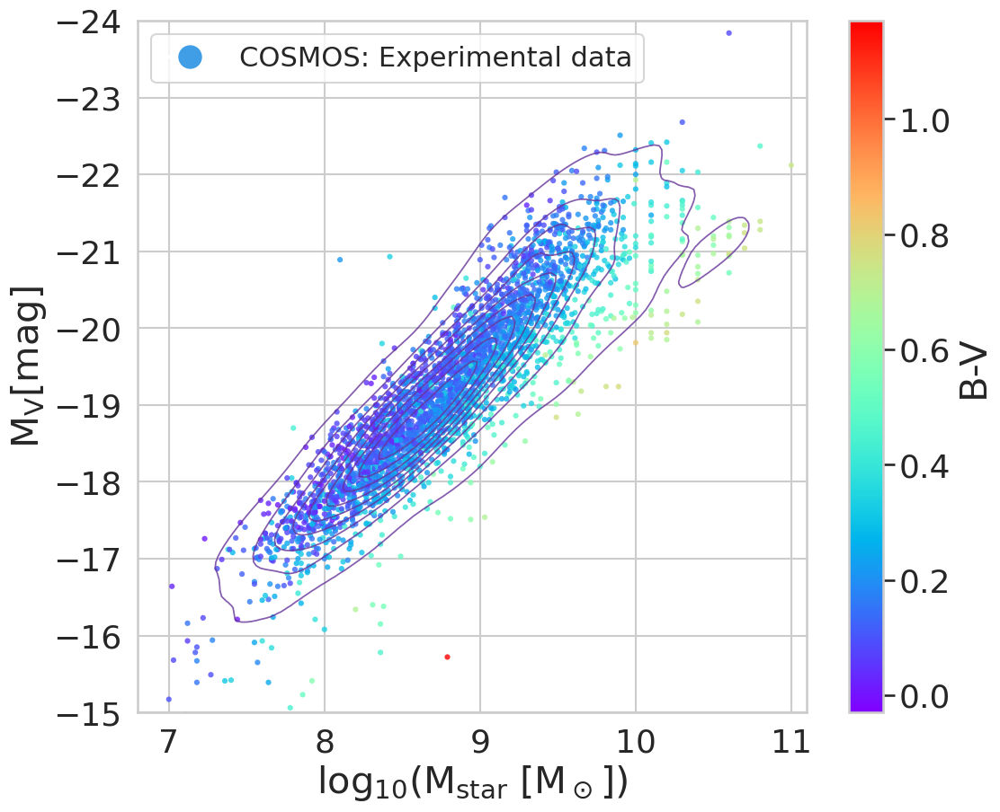

In [108]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = df_test['M_V']
y22 = df_test['M_V']

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='COSMOS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-24, -15])
plt.xlim([6.8, 11.1])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('COSMOS_mv_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

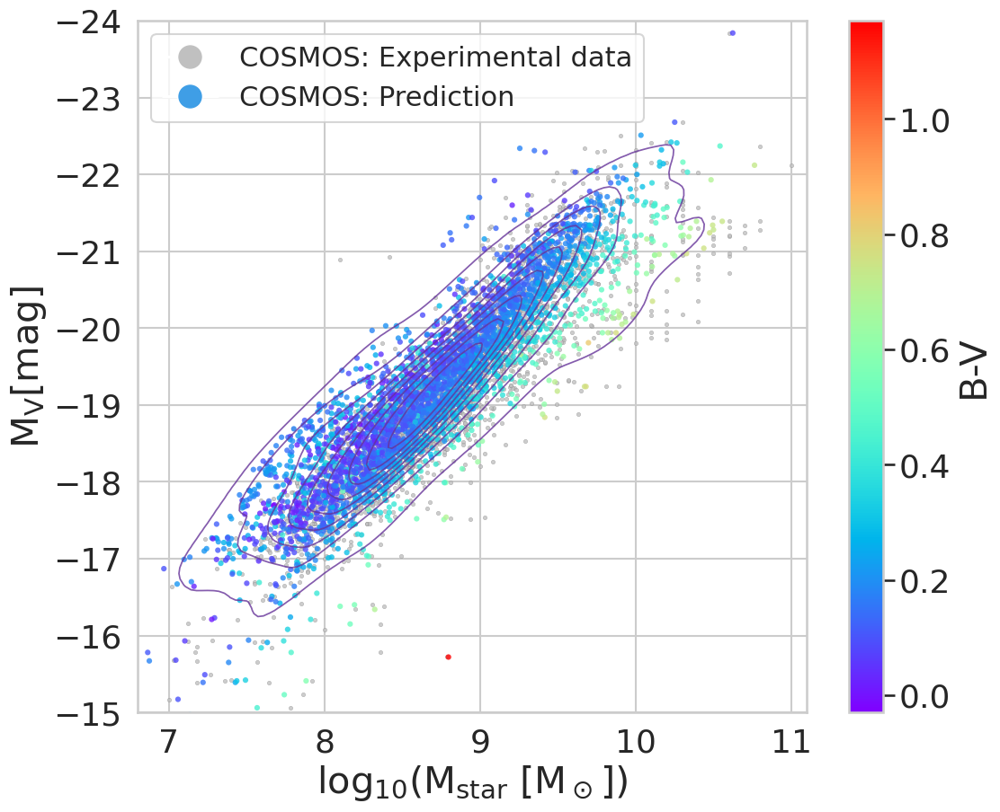

In [109]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = df_test['M_V']
y22 = df_test['M_V']

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='COSMOS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='COSMOS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-24, -15])
plt.xlim([6.8, 11.1])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('COSMOS_mv_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

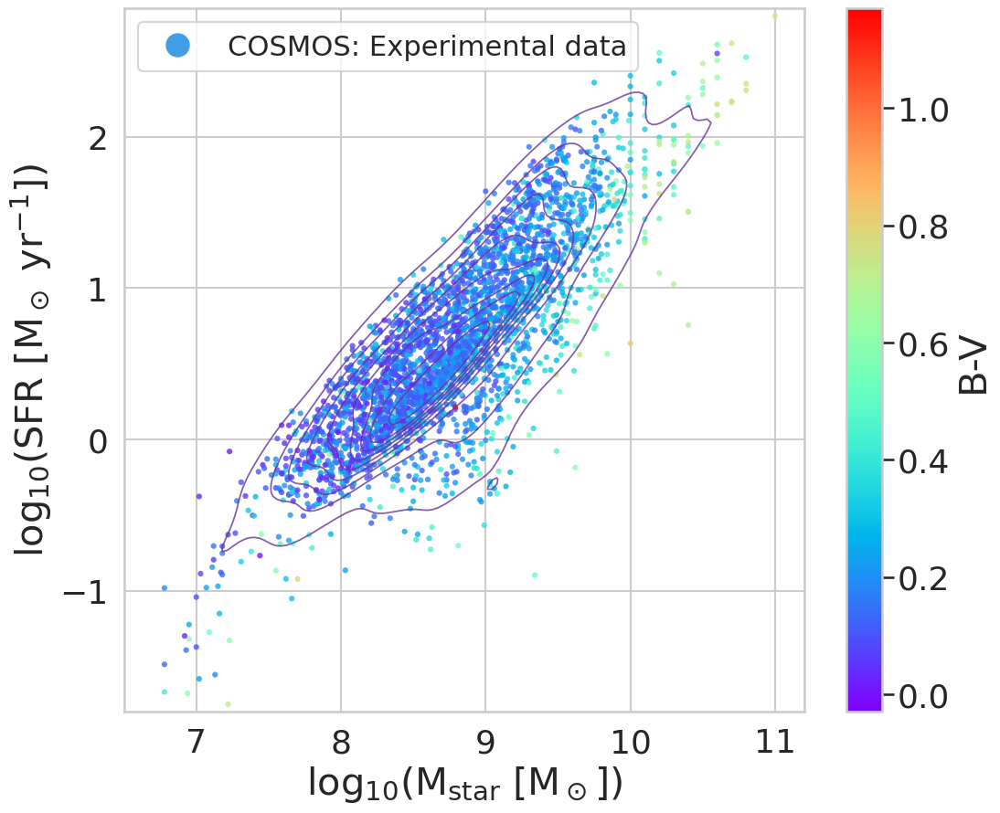

In [110]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test["mass"]
x22 = predicted_mass_cos

y11 = df_test['SFR']
y22 = predicted_sfr_cos

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='COSMOS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.8, 2.85])
plt.xlim([6.5, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('COSMOS_sfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

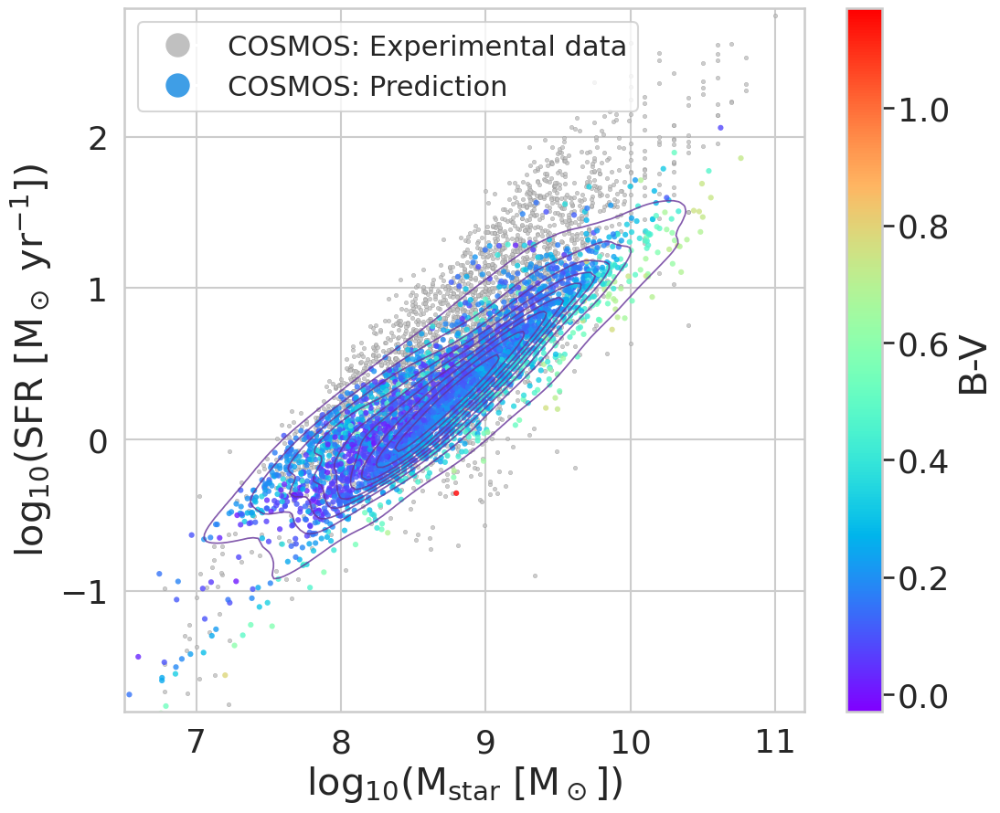

In [111]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test["mass"]
x22 = predicted_mass_cos

y11 = df_test['SFR']
y22 = predicted_sfr_cos

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='COSMOS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='COSMOS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.8, 2.85])
plt.xlim([6.5, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('COSMOS_sfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

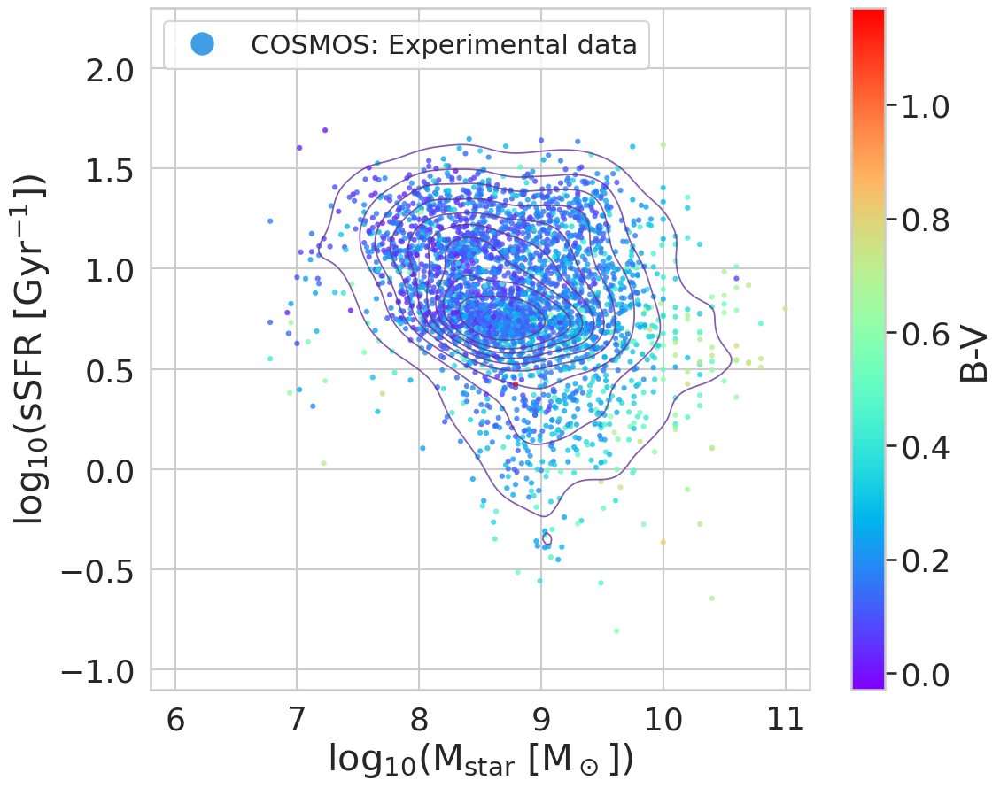

In [112]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = (-df_test['mass']+df_test['SFR'])+9
y22 = (-predicted_mass_cos+predicted_sfr_cos)+9

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='COSMOS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('COSMOS_ssfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

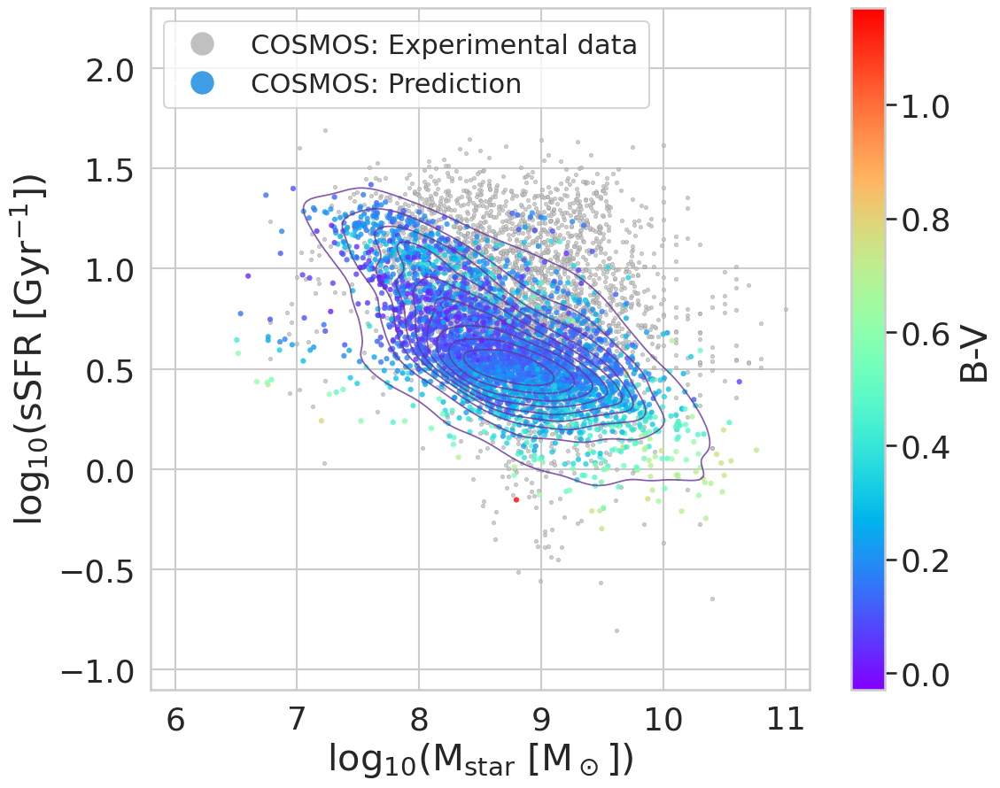

In [113]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = (-df_test['mass']+df_test['SFR'])+9
y22 = (-predicted_mass_cos+predicted_sfr_cos)+9

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='COSMOS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='COSMOS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([5.8, 11.2])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('COSMOS_ssfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

---
---
## $$\textbf{UDS}$$

In [114]:
df_mass_uds = pd.read_csv("catalogs/UDS_stellar_mass.csv")
#df_mass_uds = df_mass_uds[df_mass_uds > -90]

df_phys_uds = pd.read_csv("catalogs/UDS_phys_props.csv")
df_phys_uds = df_phys_uds[df_phys_uds > -90]

df_reds_uds = pd.read_csv("catalogs/UDS_redshift.csv")

df_mult_uds = pd.read_csv("catalogs/UDS_multiband.csv")

In [115]:
redshift = df_reds_uds[["z_best"]]
redshift.columns = ['redshift']

masa = df_mass_uds[['M_neb_med']]
masa = masa[masa > 0]
masa = np.log10(masa)
masa.columns = ['mass']

serr = df_mass_uds['s_neb_med'].mean()
merr = df_mass_uds['M_neb_med'].mean()
print('serr =', np.log10(serr/merr))

Mag_abs_U = df_phys_uds[['UMag_6a_tau^NEB']]
Mag_abs_U.columns = ['M_U']

Mag_abs_B = df_phys_uds[['BMag_6a_tau^NEB']]
Mag_abs_B.columns = ['M_B']

Mag_abs_V = df_phys_uds[['VMag_6a_tau^NEB']]
Mag_abs_V.columns = ['M_V']

Mag_abs_R = df_phys_uds[['RMag_6a_tau^NEB']]
Mag_abs_R.columns = ['M_R']

Mag_abs_I = df_phys_uds[['IMag_6a_tau^NEB']]
Mag_abs_I.columns = ['M_I']

Mag_abs_J = df_phys_uds[['JMag_6a_tau^NEB']]
Mag_abs_J.columns = ['M_J']

Mag_abs_K = df_phys_uds[['KMag_6a_tau^NEB']]
Mag_abs_K.columns = ['M_K']

EBV = df_phys_uds[['EBV_6a_tau^NEB']]
EBV.columns = ['EBV']

SFR = df_phys_uds[['SFR_14a']]
SFR = SFR[SFR > 0]
SFR = np.log10(SFR)
SFR.columns = ['SFR']

isoarea = np.log(df_mult_uds[['isoareaf_image']])
isoarea.columns = ['isoarea']

df_test = pd.concat([redshift, masa, Mag_abs_U, Mag_abs_B, Mag_abs_V, Mag_abs_R, Mag_abs_I, Mag_abs_J, Mag_abs_K, EBV, SFR, isoarea], axis = 1)
df_test = df_test.dropna()

print(df_test.shape)

serr = -0.5504252309920731
(10693, 12)


In [116]:
test_mass_cos = df_test.drop(columns = ['mass', 'SFR'])
test_mass_cos

predicted_mass_cos = mass_model.predict(np.array(test_mass_cos))
predicted_sfr_cos = sfr_model.predict(np.array(test_mass_cos))

In [117]:
df_test.sample(n = 5)

,redshift,mass,M_U,M_B,M_V,M_R,M_I,M_J,M_K,EBV,SFR,isoarea
7604,2.001,7.359835,-15.04,-15.52,-15.71,-15.78,-15.87,-16.38,-16.40,0.10,-1.070581,2.302585
2559,1.782,10.225309,-19.96,-20.84,-21.45,-21.77,-22.02,-22.65,-22.77,0.55,1.507451,5.888878
6899,1.564,8.359835,-18.03,-18.49,-18.63,-18.66,-18.63,-18.80,-18.58,0.06,0.143327,4.262680
5012,1.992,9.812913,-20.68,-21.28,-21.59,-21.73,-21.84,-22.16,-22.02,0.10,1.590842,6.091310
3724,2.113,8.544068,-18.92,-19.25,-19.29,-19.23,-19.00,-18.72,-18.21,0.06,0.275311,4.382027


In [118]:
print('Predicted mass    =', mass_model.predict([[1.623,	-16.44,	-16.97,	-17.13,	-17.13,	-17.11,	-17.11,	-16.79,	0.00,	2.639057]])[0])
print('Experimental mass =', df_test['mass'][8127])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.670, -19.99,	-20.50,	-20.75,	-20.87,	-21.00,	-21.54,	-21.55,	0.06,	5.545177]])[0])
print('Experimental mass =', df_test['mass'][3242])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.721,	-17.51,	-17.97,	-18.13,	-18.19,	-18.27,	-18.74,	-18.74,	0.06,	3.091042]])[0])
print('Experimental mass =', df_test['mass'][8563])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.302, -20.48,	-20.78,	-20.85,	-20.83,	-20.74,	-20.85,	-20.59,	0.03,	5.733341]])[0])
print('Experimental mass =', df_test['mass'][3218])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.524,	-15.59,	-16.40,	-17.17,	-17.43,	-17.30,	-17.73,	-17.56,	0.80,	2.890372]])[0])
print('Experimental mass =', df_test['mass'][2597])

Predicted mass    = 7.860336069738139
Experimental mass = 7.824776462475546
---------------------------------------------------------
Predicted mass    = 9.547280456649048
Experimental mass = 9.589949601325708
---------------------------------------------------------
Predicted mass    = 8.356548820099022
Experimental mass = 8.139879086401237
---------------------------------------------------------
Predicted mass    = 9.225514254833968
Experimental mass = 9.152288344383056
---------------------------------------------------------
Predicted mass    = 8.329251423558787
Experimental mass = 8.037426497940624


In [119]:
print('Predicted mass    =', mass_model.predict([[1.623,	-16.44,	-16.97,	-17.13,	-17.13,	-17.11,	-17.11,	-16.79,	0.00,	2.639057]])[0])
print('Experimental mass =', df_test['mass'][8127])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.670, -19.99,	-20.50,	-20.75,	-20.87,	-21.00,	-21.54,	-21.55,	0.06,	5.545177]])[0])
print('Experimental mass =', df_test['mass'][3242])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.721,	-17.51,	-17.97,	-18.13,	-18.19,	-18.27,	-18.74,	-18.74,	0.06,	3.091042]])[0])
print('Experimental mass =', df_test['mass'][8563])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.302, -20.48,	-20.78,	-20.85,	-20.83,	-20.74,	-20.85,	-20.59,	0.03,	5.733341]])[0])
print('Experimental mass =', df_test['mass'][3218])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.524,	-15.59,	-16.40,	-17.17,	-17.43,	-17.30,	-17.73,	-17.56,	0.80,	2.890372]])[0])
print('Experimental mass =', df_test['mass'][2597])

print()
print('####################################################################')
print()

print('Predicted sfr    =', sfr_model.predict([[1.623,	-16.44,	-16.97,	-17.13,	-17.13,	-17.11,	-17.11,	-16.79,	0.00,	2.639057]])[0])
print('Experimental sfr =', df_test['SFR'][8127])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.670, -19.99,	-20.50,	-20.75,	-20.87,	-21.00,	-21.54,	-21.55,	0.06,	5.545177]])[0])
print('Experimental sfr =', df_test['SFR'][3242])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.721,	-17.51,	-17.97,	-18.13,	-18.19,	-18.27,	-18.74,	-18.74,	0.06,	3.091042]])[0])
print('Experimental sfr =', df_test['SFR'][8563])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.302, -20.48,	-20.78,	-20.85,	-20.83,	-20.74,	-20.85,	-20.59,	0.03,	5.733341]])[0])
print('Experimental sfr =', df_test['SFR'][3218])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.524,	-15.59,	-16.40,	-17.17,	-17.43,	-17.30,	-17.73,	-17.56,	0.80,	2.890372]])[0])
print('Experimental sfr =', df_test['SFR'][2597])

Predicted mass    = 7.860336069738139
Experimental mass = 7.824776462475546
---------------------------------------------------------
Predicted mass    = 9.547280456649048
Experimental mass = 9.589949601325708
---------------------------------------------------------
Predicted mass    = 8.356548820099022
Experimental mass = 8.139879086401237
---------------------------------------------------------
Predicted mass    = 9.225514254833968
Experimental mass = 9.152288344383056
---------------------------------------------------------
Predicted mass    = 8.329251423558787
Experimental mass = 8.037426497940624

####################################################################

Predicted sfr    = -0.5787194250498355
Experimental sfr = -0.692503962086787
---------------------------------------------------------
Predicted sfr    = 0.8991045561004944
Experimental sfr = 1.0107238653917732
---------------------------------------------------------
Predicted sfr    = -0.06899479505609274
Experime

In [120]:
from sklearn.metrics import mean_squared_error

print('mean squared error for mass:', mean_squared_error(df_test['mass'], predicted_mass_cos)*10)
print()
print('mean squared error for SFR:', mean_squared_error(df_test['SFR'], predicted_sfr_cos)*10)

mean squared error for mass: 0.2191756886093421

mean squared error for SFR: 0.3181116021562746


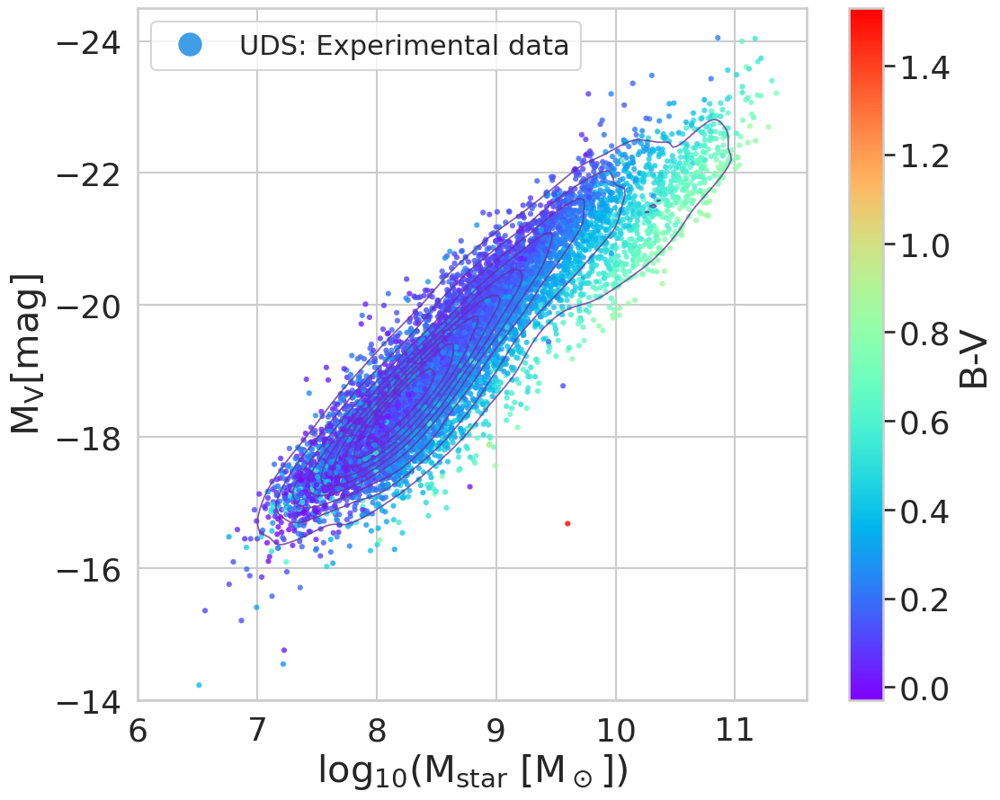

In [121]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = df_test['M_V']
y22 = df_test['M_V']

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='UDS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-24.5, -14])
plt.xlim([6, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('UDS_mv_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

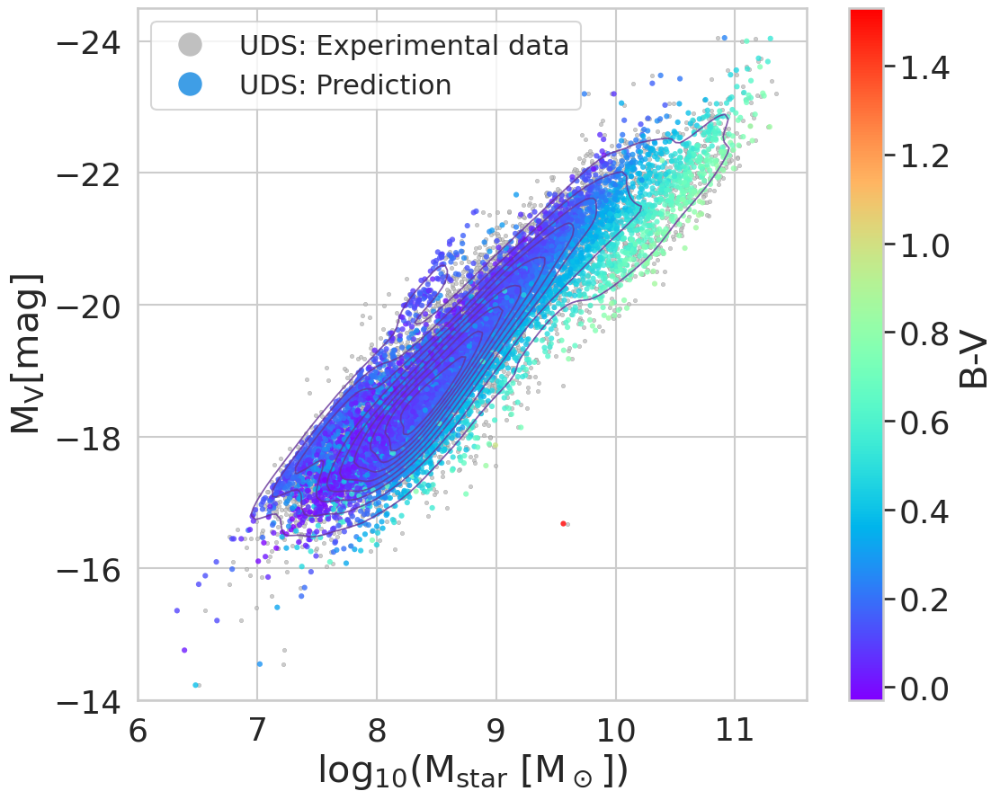

In [122]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = df_test['M_V']
y22 = df_test['M_V']

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='UDS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='UDS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-24.5, -14])
plt.xlim([6, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('UDS_mv_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

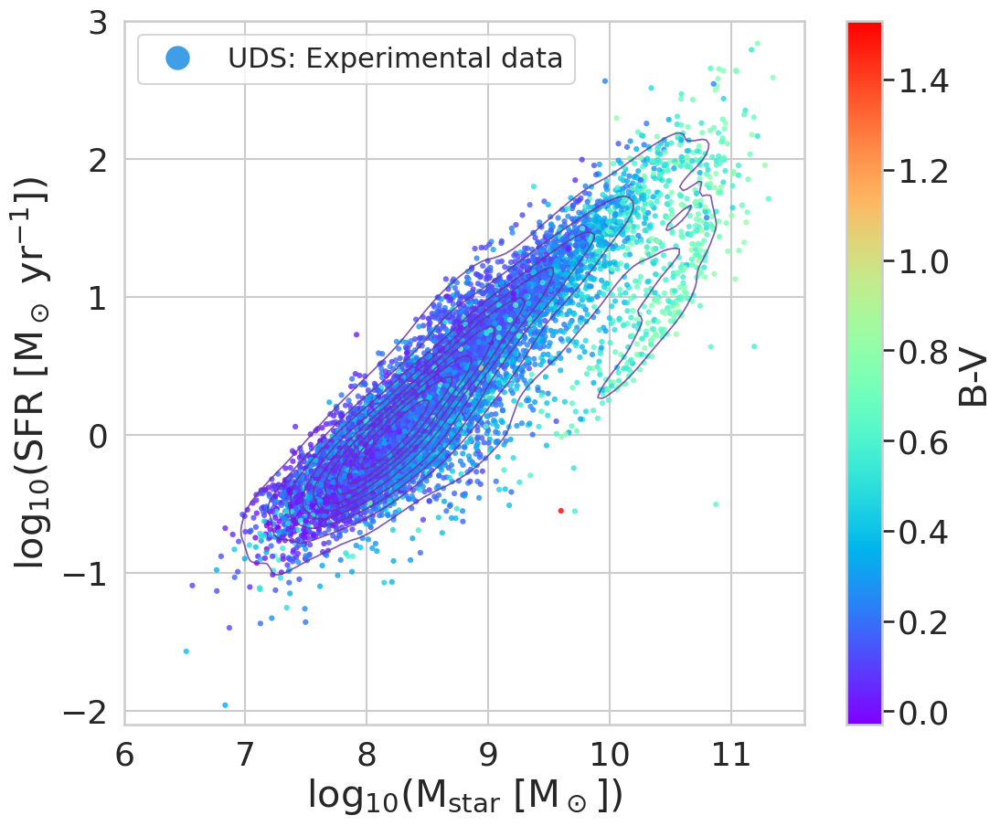

In [123]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test["mass"]
x22 = predicted_mass_cos

y11 = df_test['SFR']
y22 = predicted_sfr_cos

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']

ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='UDS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-2.1, 3.0])
plt.xlim([6, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('UDS_sfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

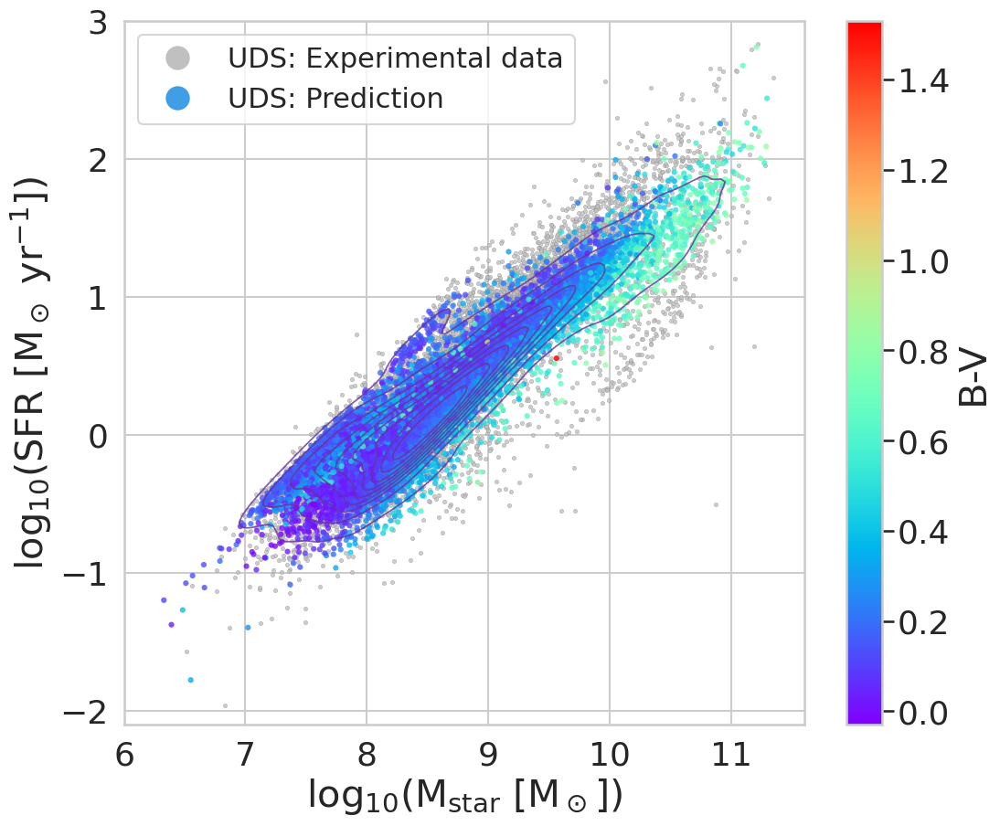

In [124]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test["mass"]
x22 = predicted_mass_cos

y11 = df_test['SFR']
y22 = predicted_sfr_cos

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='UDS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='UDS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-2.1, 3.0])
plt.xlim([6, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('UDS_sfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

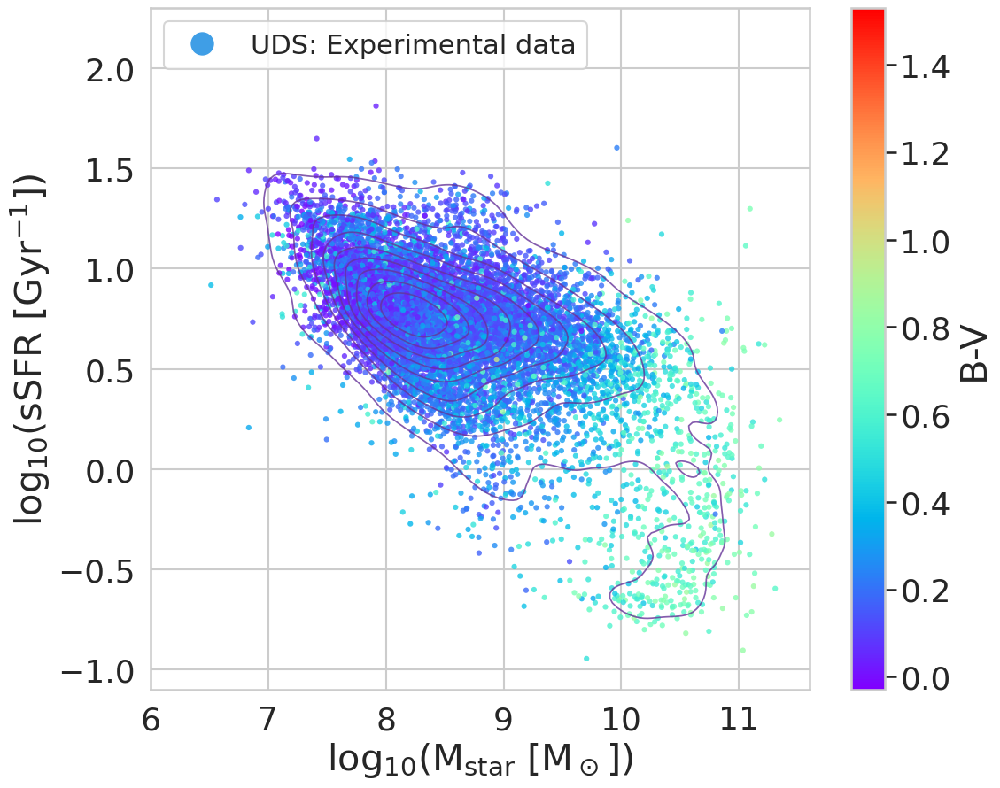

In [125]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = (-df_test['mass']+df_test['SFR'])+9
y22 = (-predicted_mass_cos+predicted_sfr_cos)+9

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='UDS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([6, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('UDS_ssfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

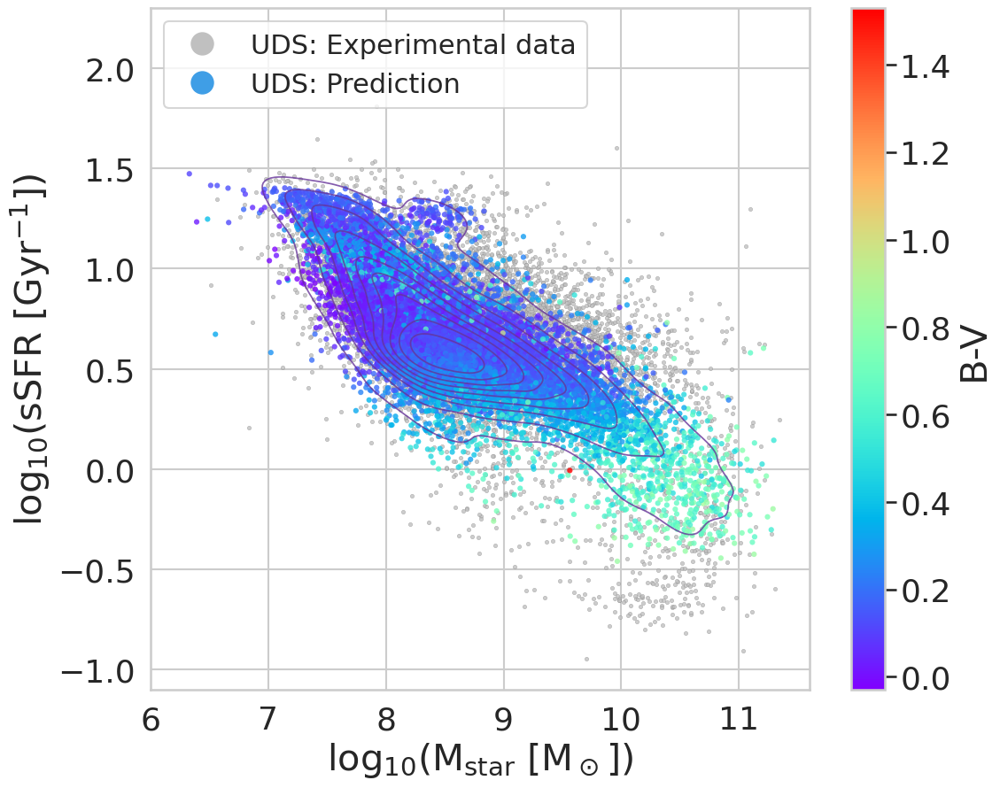

In [126]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test['mass']
x22 = predicted_mass_cos

y11 = (-df_test['mass']+df_test['SFR'])+9
y22 = (-predicted_mass_cos+predicted_sfr_cos)+9

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='UDS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='UDS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.ylim([-1.1, 2.3])
plt.xlim([6, 11.6])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('UDS_ssfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

---
---

### $$ \textbf{USE FOR GALAXIES AT OTHER REDSHIFTS} $$

In [12]:
df_mass_egs_all = pd.read_csv("catalogs/hlsp_candels_hst_wfc3_egs_multi_v1_mass-cat.txt", delim_whitespace = True)
df_mass_egs_all = df_mass_egs_all[df_mass_egs_all > -90]

df_phys_egs_all = pd.read_csv("catalogs/hlsp_candels_hst_wfc3_egs_multi_v1_physpar-cat.txt", delim_whitespace = True)
df_phys_egs_all = df_phys_egs_all[df_phys_egs_all > -90]

df_reds_egs_all = pd.read_csv("catalogs/hlsp_candels_hst_wfc3_egs_multi_v2_redshift-cat.txt", delim_whitespace = True)

df_mult_egs_all = pd.read_csv("catalogs/hlsp_candels_hst_wfc3_egs-tot-multiband_f160w_v1-4sext2_cat.txt", delim_whitespace = True)

In [13]:
redshift = df_reds_egs_all[["z_best"]]
redshift.columns = ['redshift']

masa = df_mass_egs_all[['M_neb_med']]
masa.columns = ['mass']

serr = df_mass_egs_all['s_neb_med'].mean()
merr = df_mass_egs_all['M_neb_med'].mean()
print('serr =', np.log10(serr))

Mag_abs_U = df_phys_egs_all[['UMag_6a_tau^NEB']]
Mag_abs_U.columns = ['M_U']

Mag_abs_B = df_phys_egs_all[['BMag_6a_tau^NEB']]
Mag_abs_B.columns = ['M_B']

Mag_abs_V = df_phys_egs_all[['VMag_6a_tau^NEB']]
Mag_abs_V.columns = ['M_V']

Mag_abs_R = df_phys_egs_all[['RMag_6a_tau^NEB']]
Mag_abs_R.columns = ['M_R']

Mag_abs_I = df_phys_egs_all[['IMag_6a_tau^NEB']]
Mag_abs_I.columns = ['M_I']

Mag_abs_J = df_phys_egs_all[['JMag_6a_tau^NEB']]
Mag_abs_J.columns = ['M_J']

Mag_abs_K = df_phys_egs_all[['KMag_6a_tau^NEB']]
Mag_abs_K.columns = ['M_K']

EBV = df_phys_egs_all[['EBV_6a_tau^NEB']]
EBV.columns = ['EBV']

SFR = np.log10(df_phys_egs_all[['SFR_14a']])
SFR.columns = ['SFR']

isoarea = np.log(df_mult_egs_all[['ISOAREAF_IMAGE']])
isoarea.columns = ['isoarea']

df_test = pd.concat([redshift, masa, Mag_abs_U, Mag_abs_B, Mag_abs_V, Mag_abs_R, Mag_abs_I, Mag_abs_J, Mag_abs_K, EBV, SFR, isoarea], axis = 1)
df_test = df_test.dropna()

print(df_test.redshift.min())
print(df_test.redshift.max())

print(df_test.shape)

serr = -0.6194354005657536
0.007
9.687
(38929, 12)


In [19]:
print('Predicted mass    =', mass_model.predict([[0.331,	-14.11,	-14.72,	-14.97,	-15.02,	-15.06,	-15.14,	-14.86,	0.10,	3.465736]])[0])
print('Experimental mass =', df_test['mass'][16669])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.393,-15.69,	-16.86,	-17.54,	-17.83,	-18.08,	-18.48,	-18.35,	0.00,	3.496508]])[0])
print('Experimental mass =', df_test['mass'][31762])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.046,-16.83,	-17.62,	-17.85,	-17.94,	-18.00,	-18.16,	-17.98,	0.00, 2.397895]])[0])
print('Experimental mass =', df_test['mass'][36689])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[2.660,	-21.11,	-21.68,	-21.89,	-21.91,	-21.91,	-21.95,	-21.64,	0.06,	5.641907]])[0])
print('Experimental mass =', df_test['mass'][927])
print('---------------------------------------------------------')
print('Predicted mass    =', mass_model.predict([[1.334,-16.13,-16.31,-16.64,-16.73,-16.46,-16.80,-16.74,0.30,2.772589]])[0])
print('Experimental mass =', df_test['mass'][39907])

print()

print('Predicted sfr    =', sfr_model.predict([[0.331,	-14.11,	-14.72,	-14.97,	-15.02,	-15.06,	-15.14,	-14.86,	0.10,	3.465736]])[0])
print('Experimental sfr =', df_test['SFR'][16669])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.393,-15.69,	-16.86,	-17.54,	-17.83,	-18.08,	-18.48,	-18.35,	0.00,	3.496508]])[0])
print('Experimental sfr =', df_test['SFR'][31762])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.046,-16.83,	-17.62,	-17.85,	-17.94,	-18.00,	-18.16,	-17.98,	0.00, 2.397895]])[0])
print('Experimental sfr =', df_test['SFR'][36689])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[2.660,	-21.11,	-21.68,	-21.89,	-21.91,	-21.91,	-21.95,	-21.64,	0.06,	5.641907]])[0])
print('Experimental sfr =', df_test['SFR'][927])
print('---------------------------------------------------------')
print('Predicted sfr    =', sfr_model.predict([[1.334,-16.13,-16.31,-16.64,-16.73,-16.46,-16.80,-16.74,0.30,2.772589]])[0])
print('Experimental sfr =', df_test['SFR'][39907])

Predicted mass    = 7.186177264486275
Experimental mass = 7.06
---------------------------------------------------------
Predicted mass    = 8.729447848698044
Experimental mass = 8.69
---------------------------------------------------------
Predicted mass    = 8.361328817504443
Experimental mass = 8.27
---------------------------------------------------------
Predicted mass    = 9.846226735055268
Experimental mass = 9.88
---------------------------------------------------------
Predicted mass    = 7.498230131009393
Experimental mass = 7.3

Predicted sfr    = -1.3368965223067917
Experimental sfr = -1.4521022824369028
---------------------------------------------------------
Predicted sfr    = -0.44522163923322133
Experimental sfr = 0.1619666163640749
---------------------------------------------------------
Predicted sfr    = -0.2769412061507752
Experimental sfr = -0.14442027749828215
---------------------------------------------------------
Predicted sfr    = 1.3014727889320699
Experi

In [129]:
test_mass_egs_all = df_test.drop(columns = ['mass', 'SFR'])
test_mass_egs_all

predicted_mass_egs_all = mass_model.predict(np.array(test_mass_egs_all))
predicted_sfr_egs_all  = sfr_model.predict(np.array(test_mass_egs_all))

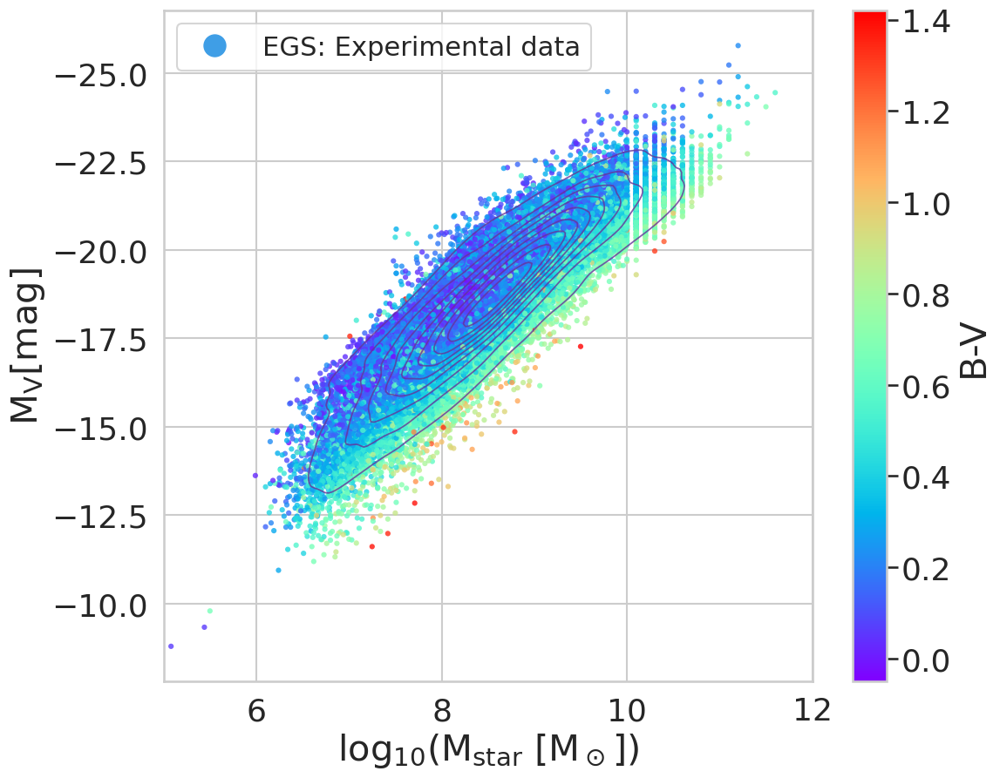

In [130]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = df_test['mass']
x22 = predicted_mass_egs_all

y11 = df_test['M_V']
y22 = df_test['M_V']

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)


#plt.ylim([-24.5, -14])
plt.xlim([5, 12])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('EGS_allz_mv_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

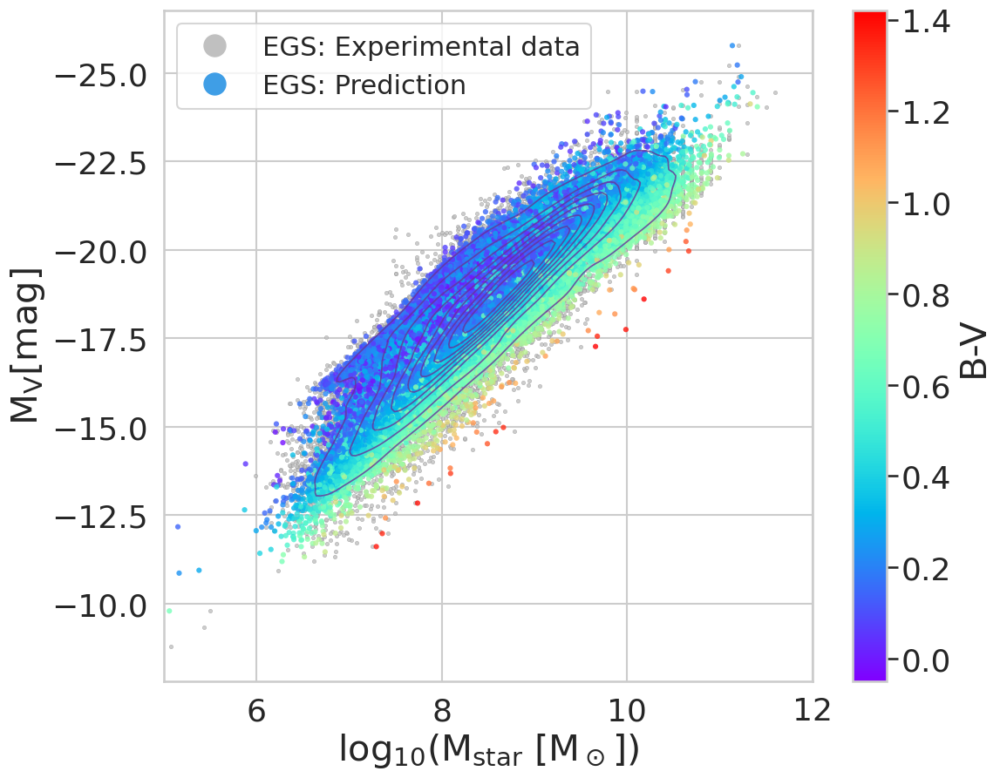

In [131]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26)

x11 = df_test['mass']
x22 = predicted_mass_egs_all

y11 = df_test['M_V']
y22 = df_test['M_V']

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)


#plt.ylim([-24.5, -14])
plt.xlim([5, 12])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V [mag]}$', size = 30)
plt.gca().invert_yaxis()

fig.figure.savefig('EGS_allz_mv_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

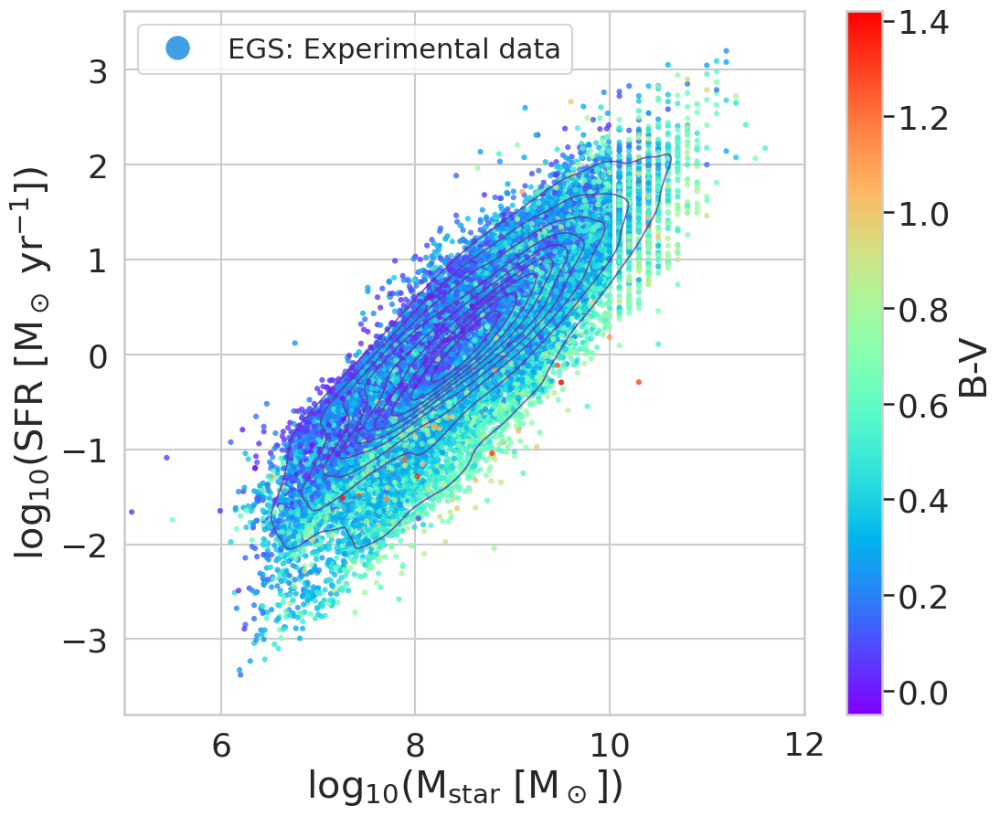

In [132]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test["mass"]
x22 = predicted_mass_egs_all

y11 = df_test['SFR']
y22 = predicted_sfr_egs_all

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

#plt.ylim([-2.1, 3.0])
plt.xlim([5, 12])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_allz_sfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

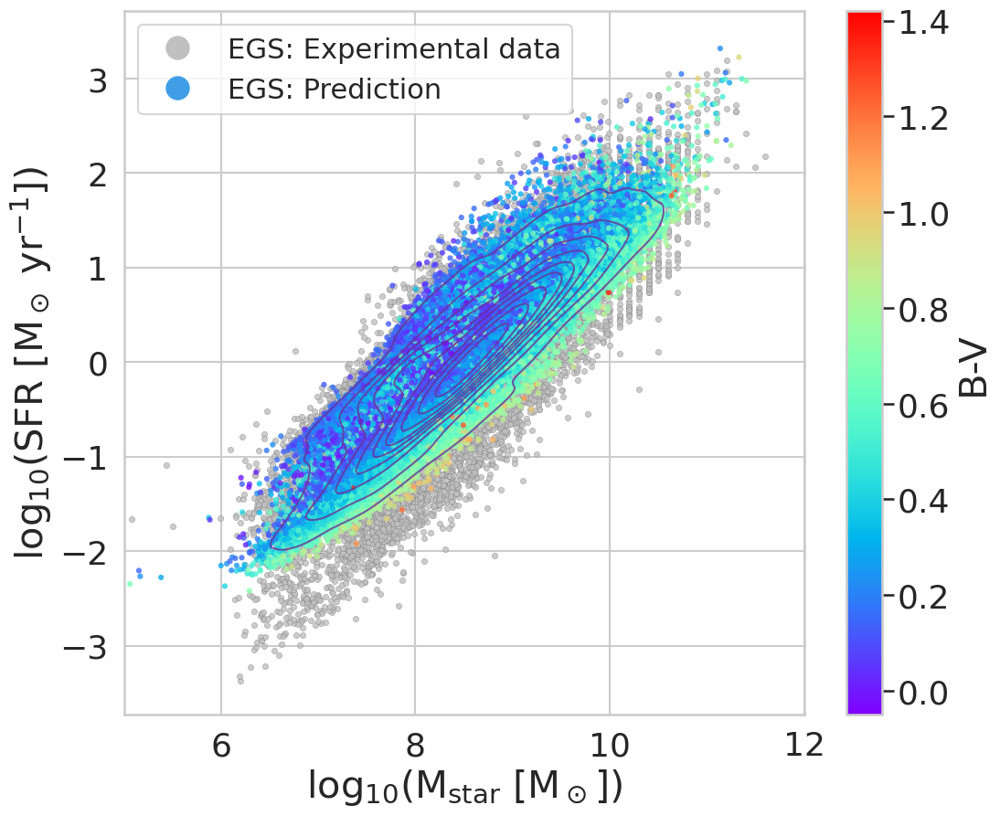

In [133]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test["mass"]
x22 = predicted_mass_egs_all

y11 = df_test['SFR']
y22 = predicted_sfr_egs_all

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'silver', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 20)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.5)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

#plt.ylim([-2.1, 3.0])
plt.xlim([5, 12])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR}$ $\mathregular{[M_\odot}$ $\mathregular{yr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_allz_sfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()

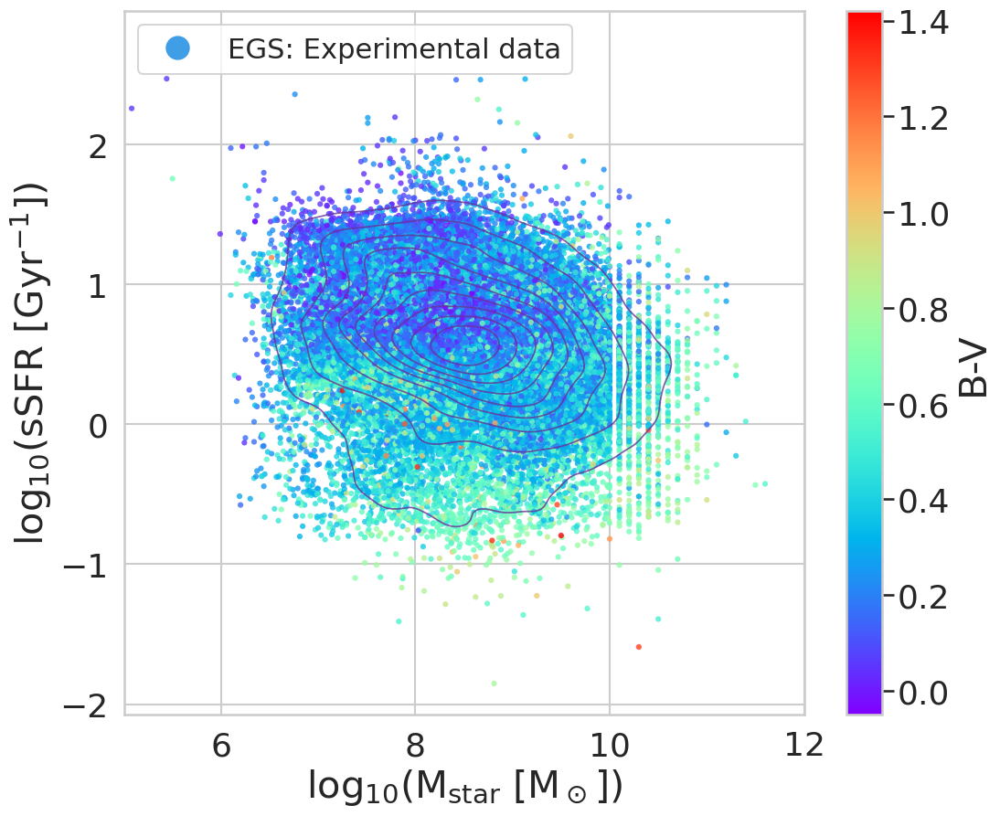

In [139]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test['mass']
x22 = predicted_mass_egs_all

y11 = (-df_test['mass']+df_test['SFR'])+9
y22 = (-predicted_mass_egs_all+predicted_sfr_egs_all)+9

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


ax = sns.scatterplot(x = x11, y = y11, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x11, y = y11, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

#plt.ylim([-1.1, 2.3])
plt.xlim([5, 12])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_allz_ssfr_exp.png',dpi=300, bbox_inches = 'tight')

plt.show()

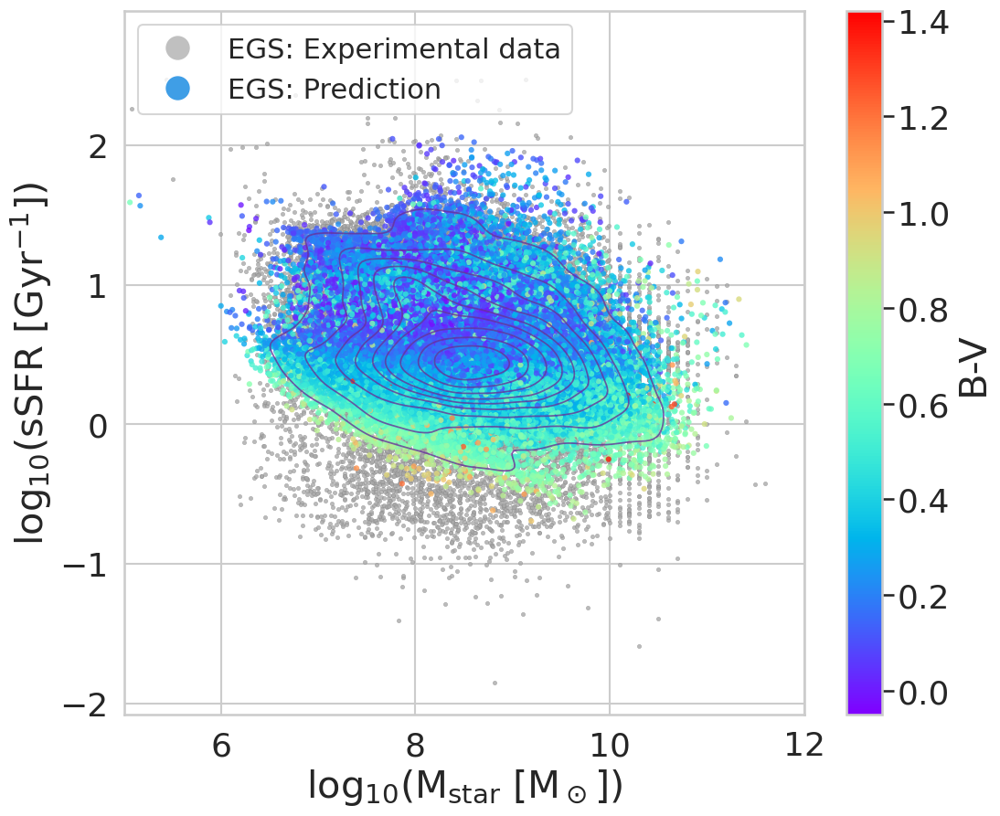

In [138]:

plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=26) 
matplotlib.rc('ytick', labelsize=26) 

x11 = df_test['mass']
x22 = predicted_mass_egs_all

y11 = (-df_test['mass']+df_test['SFR'])+9
y22 = (-predicted_mass_egs_all+predicted_sfr_egs_all)+9

z = pd.DataFrame(df_test['M_B'] - df_test['M_V'])
z.columns = ['B-V']


sns.scatterplot(x = x11, y = y11, color = 'darkgray', edgecolor = 'grey', zorder = 1, alpha = 0.8, s = 10)
#sns.kdeplot(x = x11, y = y11, fill = False, color = 'sienna', zorder = 1, alpha = 0.8, linewidths = 1.5)

fig = ax = sns.scatterplot(x = x22, y = y22, edgecolor = 'none', zorder = 1, alpha = 0.8, s = 20, data = z, hue = 'B-V', palette = 'rainbow')
#sns.kdeplot(x = x22, y = y22, fill = True, color = 'rebeccapurple', zorder = 2, alpha = 0.8)
fig = sns.kdeplot(x = x22, y = y22, fill = False, color = 'rebeccapurple', zorder = 2, alpha = 0.8, linewidths = 1.25)

legend_elements = [Line2D([0], [0], marker='o', color='w', label='EGS: Experimental data',
                          markerfacecolor='silver', markersize=20),
                   Line2D([0], [0], marker='o', color='w', label='EGS: Prediction',
                          markerfacecolor='#3f9ee6', markersize=20)]

plt.legend(handles=legend_elements, fontsize = 22, loc = 'upper left')

#plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

#plt.ylim([-1.1, 2.3])
plt.xlim([5, 12])

plt.xlabel('$\mathregular{log_{10}(M_{star}}$ $\mathregular{[M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(sSFR}$ $\mathregular{[Gyr^{-1}])}$', size = 30)

fig.figure.savefig('EGS_allz_ssfr_pred.png',dpi=300, bbox_inches = 'tight')

plt.show()